<a href="https://colab.research.google.com/github/ladofa/edu/blob/master/Example_CycleGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#parameters
image_size = 128
gen_n_filters = 32
disc_n_filters = 32
buffer_max_length = 500
batch_size = 32

In [2]:
!pip install tensorflow-addons

     |████████████████████████████████| 1.1 MB 14.7 MB/s 


In [3]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import tensorflow_addons.layers as layers_addon

import os
import random
import numpy as np

사과/귤 사진 불러오기

In [4]:
!wget https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/apple2orange.zip

--2021-12-27 07:56:34--  https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/apple2orange.zip
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.244.190
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 78456409 (75M) [application/zip]
Saving to: ‘apple2orange.zip’

apple2orange.zip    100%[===================>]  74.82M  1.77MB/s    in 40s     

2021-12-27 07:57:15 (1.86 MB/s) - ‘apple2orange.zip’ saved [78456409/78456409]



In [5]:
!unzip -qq apple2orange.zip

# 데이터셋 생성(tfrecord)

In [6]:
def int64_feature(value):
  return tf.train.Feature(int64_list=tf.train.Int64List(value=value))

def bytes_feature(value):
  return tf.train.Feature(bytes_list=tf.train.BytesList(value=value))

def floats_feature(value):
  return tf.train.Feature(float_list=tf.train.FloatList(value=value))

In [ ]:
#tf record 파일 생성 후 생성된 샘플 개수 리턴
def gen_tfrecord(base_dir, record_name):
    writer = tf.io.TFRecordWriter(record_name)
    count = 0
    for root, dirs, filenames in os.walk(base_dir):
        for filename in filenames:
            path = os.path.join(root, filename)
            feat_dict = {}
            file = open(path, 'rb')
            feat_dict['image'] = bytes_feature([file.read()])
            file.close()
            example = tf.train.Example(features=tf.train.Features(feature=feat_dict))
            writer.write(example.SerializeToString())
            count += 1
    writer.close()
    return count

count_trainA = gen_tfrecord('apple2orange/trainA', 'trainA.tfrecord')
count_trainB = gen_tfrecord('apple2orange/trainB', 'trainB.tfrecord')
count_testA = gen_tfrecord('apple2orange/testA', 'testA.tfrecord')
count_testB = gen_tfrecord('apple2orange/testB', 'testB.tfrecord')

print(count_trainA)
print(count_trainB)
print(count_testA)
print(count_testB)



995
1019
266
248


#

In [ ]:
#생성된 레코드 파일 로드
dataset_trainA = tf.data.TFRecordDataset('trainA.tfrecord')
dataset_trainB = tf.data.TFRecordDataset('trainB.tfrecord')
dataset_testA = tf.data.TFRecordDataset('testA.tfrecord')
dataset_testB = tf.data.TFRecordDataset('testB.tfrecord')

#레코드 파일로부터 이미지 디코딩
def pre_process(example):
    tfrecord_format = (
        {
            'image':tf.io.FixedLenFeature([], tf.string),
        }
    )
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = tf.io.decode_jpeg(example['image'])
    image = tf.cast(image, tf.float32)
    image = image / 127.5 - 1
    image = tf.image.resize(image, (image_size, image_size))
    return image


dataset_trainA = dataset_trainA.repeat().map(pre_process, num_parallel_calls=tf.data.experimental.AUTOTUNE).shuffle(200).batch(batch_size).prefetch(1)
dataset_trainB = dataset_trainB.repeat().map(pre_process, num_parallel_calls=tf.data.experimental.AUTOTUNE).shuffle(200).batch(batch_size).prefetch(1)
dataset_testA = dataset_testA.map(pre_process, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(batch_size).prefetch(1)
dataset_testB = dataset_testB.map(pre_process, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(batch_size).prefetch(1)

# 데이터셋 생성 (generator)
tfrecord를 이용한 방법을 대체할 수 있음

In [7]:
from functools import partial

def gen(path):
    for root, dirs, filenames in os.walk(path):
        for filename in filenames:
            yield os.path.join(root, filename)

datasets = []
root = 'apple2orange'
for target in ['trainA', 'trainB', 'testA', 'testB']:
    path = os.path.join('apple2orange', target)
    d = tf.data.Dataset.from_generator(partial(gen, path=path), tf.string, ())
    datasets.append(d)
dataset_trainA, dataset_trainB, dataset_testA, dataset_testB = datasets

def pre_process(path):
    bin = tf.io.read_file(path)
    image = tf.io.decode_jpeg(bin)
    image = tf.cast(image, tf.float32)
    image = image / 127.5 - 1
    image = tf.image.resize(image, (image_size, image_size))
    return image

#이하 tfrecord와 같음
dataset_trainA = dataset_trainA.map(pre_process, num_parallel_calls=tf.data.experimental.AUTOTUNE).cache().repeat().shuffle(200).batch(batch_size).prefetch(1)
dataset_trainB = dataset_trainB.map(pre_process, num_parallel_calls=tf.data.experimental.AUTOTUNE).cache().repeat().shuffle(200).batch(batch_size).prefetch(1)
dataset_testA = dataset_testA.map(pre_process, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(batch_size).prefetch(1)
dataset_testB = dataset_testB.map(pre_process, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(batch_size).prefetch(1)

# dataset테스트

(32, 128, 128, 3)


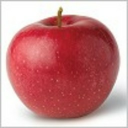

(32, 128, 128, 3)


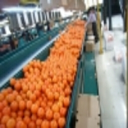

(32, 128, 128, 3)


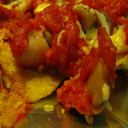

(32, 128, 128, 3)


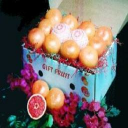

In [8]:
from google.colab.patches import cv2_imshow

for d in [dataset_trainA, dataset_trainB, dataset_testA, dataset_testB]:
    for images in d.take(1):
        print(images.shape)
        image = images.numpy()[0]
        image = image * 127.5 + 127.5
        image = image[..., [2, 1, 0]]
        cv2_imshow(image)

In [9]:
def get_unet_generator():
    def downsample(input, filters, f_size=4):
        d = layers.Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(input)
        d = layers_addon.InstanceNormalization(axis = -1, center = False, scale = False)(d)
        d = layers.Activation('relu')(d)
        return d

    def upsample(layer_input, skip_input, filters, f_size=4, dropout_rate=0):
        u = layers.UpSampling2D(size=2)(layer_input)
        u = layers.Conv2D(filters, kernel_size=f_size, strides=1, padding='same')(u)
        u = layers_addon.InstanceNormalization(axis = -1, center = False, scale = False)(u)
        u = layers.Activation('relu')(u)
        if dropout_rate:
            u = layers.Dropout(dropout_rate)(u)

        u = layers.Concatenate()([u, skip_input])
        return u

    # Image input
    input = layers.Input(shape=(image_size, image_size, 3))

    # Downsampling
    d1 = downsample(input, gen_n_filters) #64, 64, 32
    d2 = downsample(d1, gen_n_filters*2) #32, 32, 64
    d3 = downsample(d2, gen_n_filters*4) #16, 16, 128
    d4 = downsample(d3, gen_n_filters*8) #8, 8, 256

    # Upsampling
    u1 = upsample(d4, d3, gen_n_filters*4) #16, 16, 256
    u2 = upsample(u1, d2, gen_n_filters*2) #32, 32, 128
    u3 = upsample(u2, d1, gen_n_filters) #64, 64, 64

    u4 = layers.UpSampling2D(size=2)(u3)
    output = layers.Conv2D(3, kernel_size=4, strides=1, padding='same', activation='tanh')(u4)
    return keras.models.Model(input, output)

In [10]:
def get_resnet_generator():
    class ReflectionPadding2D(layers.Layer):
        def __init__(self, padding=(1, 1), **kwargs):
            self.padding = tuple(padding)
            self.input_spec = [layers.InputSpec(ndim=4)]
            super(ReflectionPadding2D, self).__init__(**kwargs)

        def compute_output_shape(self, s):
            """ If you are using "channels_last" configuration"""
            return (s[0], s[1] + 2 * self.padding[0], s[2] + 2 * self.padding[1], s[3])

        def call(self, x, mask=None):
            w_pad,h_pad = self.padding
            return tf.pad(x, [[0,0], [h_pad,h_pad], [w_pad,w_pad], [0,0] ], 'REFLECT')


    random_normal = keras.initializers.RandomNormal(mean=0., stddev=0.02)
    def conv7s1(layer_input, filters, final):
        y = ReflectionPadding2D(padding =(3,3))(layer_input)
        y = layers.Conv2D(filters, kernel_size=(7,7), strides=1, padding='valid', kernel_initializer = random_normal)(y)
        if final:
            y = layers.Activation('tanh')(y)
        else:
            y = layers_addon.InstanceNormalization(axis = -1, center = False, scale = False)(y)
            y = layers.Activation('relu')(y)
        return y

    def downsample(layer_input,filters):
        y = layers.Conv2D(filters, kernel_size=(3,3), strides=2, padding='same', kernel_initializer = random_normal)(layer_input)
        y = layers_addon.InstanceNormalization(axis = -1, center = False, scale = False)(y)
        y = layers.Activation('relu')(y)
        return y

    def residual(layer_input, filters):
        shortcut = layer_input
        y = ReflectionPadding2D(padding =(1,1))(layer_input)
        y = layers.Conv2D(filters, kernel_size=(3, 3), strides=1, padding='valid', kernel_initializer = random_normal)(y)
        y = layers_addon.InstanceNormalization(axis = -1, center = False, scale = False)(y)
        y = layers.Activation('relu')(y)
        
        y = ReflectionPadding2D(padding =(1,1))(y)
        y = layers.Conv2D(filters, kernel_size=(3, 3), strides=1, padding='valid', kernel_initializer = random_normal)(y)
        y = layers_addon.InstanceNormalization(axis = -1, center = False, scale = False)(y)

        return shortcut + y

    def upsample(layer_input,filters):
        y = layers.Conv2DTranspose(filters, kernel_size=(3, 3), strides=2, padding='same', kernel_initializer = random_normal)(layer_input)
        y = layers_addon.InstanceNormalization(axis = -1, center = False, scale = False)(y)
        y = layers.Activation('relu')(y)

        return y


    # Image input
    img = layers.Input(shape=(image_size, image_size, 3))

    y = img

    y = conv7s1(y, gen_n_filters, False)
    y = downsample(y, gen_n_filters * 2)
    y = downsample(y, gen_n_filters * 4)
    y = residual(y, gen_n_filters * 4)
    y = residual(y, gen_n_filters * 4)
    y = residual(y, gen_n_filters * 4)
    y = residual(y, gen_n_filters * 4)
    y = residual(y, gen_n_filters * 4)
    y = residual(y, gen_n_filters * 4)
    y = residual(y, gen_n_filters * 4)
    y = residual(y, gen_n_filters * 4)
    y = residual(y, gen_n_filters * 4)
    y = upsample(y, gen_n_filters * 2)
    y = upsample(y, gen_n_filters)
    y = conv7s1(y, 3, True)
    output = y


    return keras.models.Model(img, output)


In [11]:
def get_discriminator():
    random_normal = keras.initializers.RandomNormal(mean=0., stddev=0.02)
    def conv4(input,filters, stride = 2, norm=True):
        y = layers.Conv2D(filters, kernel_size=(4,4), strides=stride, padding='same', kernel_initializer = random_normal)(input)
        
        if norm:
            y = layers_addon.InstanceNormalization(axis = -1, center = False, scale = False)(y)

        y = layers.LeakyReLU(0.2)(y)
        
        return y

    input = layers.Input(shape=(image_size, image_size, 3))

    y = conv4(input, disc_n_filters, stride = 2, norm = False) #64
    y = conv4(y, disc_n_filters*2, stride = 2) #32
    y = conv4(y, disc_n_filters*4, stride = 2) #16
    y = conv4(y, disc_n_filters*8, stride = 1) #8

    y = layers.Conv2D(1, kernel_size=4, strides=1,
                      padding='same',kernel_initializer = random_normal,
                      activation='sigmoid')(y)
    output = layers.Flatten()(y)


    return keras.models.Model(input, output)

In [12]:
d_A = get_discriminator()
d_B = get_discriminator()
#unet 과 resnet 중 선택
g_AB = get_unet_generator()
g_BA = get_unet_generator()

# Adam(learning_rate, 0.5)
d_A.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
d_B.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Input images from both domains
input_A = layers.Input(shape=(image_size, image_size, 3))
input_B = layers.Input(shape=(image_size, image_size, 3))

# Translate images to the other domain
fake_B = g_AB(input_A)
fake_A = g_BA(input_B)

# Translate images back to original domain
reconstr_A = g_BA(fake_B)
reconstr_B = g_AB(fake_A)

# Identity mapping of images
img_A_id = g_BA(input_A)
img_B_id = g_AB(input_B)

# Discriminators determines validity of translated images
valid_A = d_A(fake_A)
valid_B = d_B(fake_B)

# Combined model trains generators to fool discriminators
combined = keras.models.Model(
    inputs=[input_A, input_B],
    outputs=[ valid_A, valid_B,  #true, ture
              reconstr_A, reconstr_B, #a  b
              img_A_id, img_B_id ]    #a  b
)

lambda_validation = 1
lambda_reconstr = 10
lambda_id = 2

combined.compile(
    loss=['binary_crossentropy', 'binary_crossentropy',
          'mae', 'mae',
          'mae', 'mae'],
    loss_weights=[lambda_validation, lambda_validation,
                  lambda_reconstr, lambda_reconstr,
                  lambda_id, lambda_id ],
    optimizer=keras.optimizers.Adam(0.0002, 0.5)
)

buffer_A = list()
buffer_B = list()
step = 0

In [13]:
%load_ext tensorboard

tf_writer = tf.summary.create_file_writer('logs')
tf_writer.set_as_default()

In [14]:
%tensorboard --logdir=logs

<IPython.core.display.Javascript object>

In [15]:
label_true = np.ones((batch_size, d_A.output.shape[-1]))
label_false = np.zeros((batch_size, d_A.output.shape[-1]))

test_image_A = list(dataset_testA.take(1))[0]
test_image_B = list(dataset_testB.take(1))[0]

for images_A, images_B in zip(dataset_trainA, dataset_trainB):
    step += 1

    # Translate images to opposite domain
    fake_B = g_AB(images_A).numpy()
    fake_A = g_BA(images_B).numpy()

    buffer_B.extend(fake_B)
    buffer_A.extend(fake_A)

    if len(buffer_A) < buffer_max_length:
        print('filling buffer...')
        continue

    random.shuffle(buffer_A)
    random.shuffle(buffer_B)

    fake_A_rnd = np.array(buffer_A[:batch_size])
    fake_B_rnd = np.array(buffer_B[:batch_size])
    del buffer_A[:batch_size]
    del buffer_B[:batch_size]

    # Train the discriminators (original images = real / translated = Fake)
    d_A.trainable = True
    d_B.trainable = True
    dA_loss_real = d_A.train_on_batch(images_A, label_true)
    dA_loss_fake = d_A.train_on_batch(fake_A_rnd, label_false)
    dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)

    dB_loss_real = d_B.train_on_batch(images_B, label_true)
    dB_loss_fake = d_B.train_on_batch(fake_B_rnd, label_false)
    dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

     

    # Total disciminator loss
    d_loss_total = 0.5 * np.add(dA_loss, dB_loss)

    tf.summary.scalar('train_real_loss', dA_loss_real[0] + dB_loss_real[0], step=step)
    tf.summary.scalar('train_fake_loss', dA_loss_fake[0] + dB_loss_fake[0], step=step)

    # Train the generators
    d_A.trainable = False
    d_B.trainable = False
    g_loss = combined.train_on_batch([images_A, images_B],
                            [label_true, label_true,
                            images_A, images_B,
                            images_A, images_B])
    reconst_loss = np.sum(g_loss[3:5])
    id_loss = np.sum(g_loss[5:7])
    tf.summary.scalar('train_reconst_loss', reconst_loss, step=step)
    tf.summary.scalar('train_id_loss', id_loss, step=step)

    print('\r', step, d_loss_total, reconst_loss, id_loss, end='')

    # Record images for each 100 steps
    if step % 100 == 0:
        tf.summary.image('original_A', test_image_A[:10] * 0.5 + 0.5, step=step)
        tf.summary.image('original_B', test_image_B[:10] * 0.5 + 0.5, step=step)
        fake_B = g_AB(test_image_A[:10])
        fake_A = g_BA(test_image_B[:10])
        tf.summary.image('fake_A_to_B', fake_B * 0.5 + 0.5, step=step)
        tf.summary.image('fake_B_to_A', fake_A * 0.5 + 0.5, step=step)


filling buffer...
filling buffer...
filling buffer...
filling buffer...
filling buffer...
filling buffer...
filling buffer...
filling buffer...
filling buffer...
filling buffer...
filling buffer...
filling buffer...
filling buffer...
filling buffer...
filling buffer...
 8077 [0.27270041 0.015625  ] 0.30966944992542267 0.29031282663345337

Exception ignored in: <function IteratorResourceDeleter.__del__ at 0x7f8eaab7e710>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/iterator_ops.py", line 569, in __del__
    def __del__(self):
KeyboardInterrupt


KeyboardInterrupt: ignored

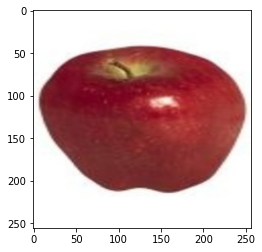

In [16]:
import cv2
import matplotlib.pyplot as plt
apple = cv2.imread('apple2orange/testA/n07740461_10080.jpg')
plt.imshow(apple[..., [2, 1, 0]])
apple = cv2.resize(apple, (image_size, image_size))
apple = apple[None, :, :, [2, 1, 0]].astype(np.float32) / 127.5 - 1
fake_orange = np.uint8(g_AB.predict(apple) * 127.5 + 127.5)
fake_orange = fake_orange[0, ...]
# fake_orange = fake_orange[..., [2, 1, 0]]



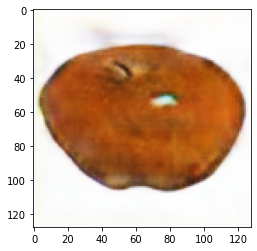

In [17]:
plt.imshow(fake_orange)

In [18]:
d_B(g_AB.predict(apple))

<tf.Tensor: shape=(1, 256), dtype=float32, numpy=
array([[0.71548355, 0.79221827, 0.5164076 , 0.54221296, 0.40552872,
        0.5267472 , 0.7606448 , 0.75291795, 0.8437995 , 0.804631  ,
        0.83706933, 0.80001837, 0.62203383, 0.6670764 , 0.55584234,
        0.6224503 , 0.7475966 , 0.48972183, 0.24751599, 0.39501956,
        0.363226  , 0.6111887 , 0.8272933 , 0.9046606 , 0.9149906 ,
        0.88486046, 0.8849029 , 0.8089969 , 0.6226088 , 0.7431342 ,
        0.6983258 , 0.7477684 , 0.80820626, 0.63323456, 0.38302258,
        0.40356404, 0.27758276, 0.18333057, 0.3528277 , 0.5842091 ,
        0.6915508 , 0.69768655, 0.7168521 , 0.8407423 , 0.74851847,
        0.8740383 , 0.87049437, 0.72261935, 0.86030036, 0.61449546,
        0.20574477, 0.29805377, 0.15680093, 0.10128525, 0.1651332 ,
        0.30289072, 0.27391404, 0.3409944 , 0.37028268, 0.5306067 ,
        0.5817873 , 0.6634327 , 0.7944326 , 0.52180505, 0.90166026,
        0.5323665 , 0.39032048, 0.4367393 , 0.6317528 , 0.45835966